In [20]:
import pandas
import numpy
import matplotlib.pyplot as plt
import seaborn
from sklearn.feature_extraction.text import CountVectorizer
import re

#count=CountVectorizer()

#Pegando base de dados retirada - IMDB Dataset
#https://www.kaggle.com/datasets/columbine/imdb-dataset-sentiment-analysis-in-csv-format?resource=download

# Baseado de https://thecleverprogrammer.com/2020/12/07/sentiment-analysis-with-python/
data=pandas.read_csv("base/Train.csv")
pandas.set_option('display.max_rows', None)
display(data)

,text,label
0,I grew up (b. 1965) watching and loving the Th...,0
1,"When I put this movie in my DVD player, and sa...",0
2,Why do people who do not know what a particula...,0
3,Even though I have great interest in Biblical ...,0
4,Im a die hard Dads Army fan and nothing will e...,1
5,A terrible movie as everyone has said. What ma...,0
6,Finally watched this shocking movie last night...,1
7,I caught this film on AZN on cable. It sounded...,0
8,It may be the remake of 1987 Autumn's Tale aft...,1
9,My Super Ex Girlfriend turned out to be a plea...,1


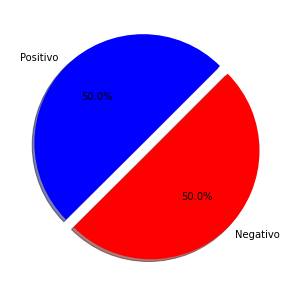

In [13]:
# Vendo a distribuição dos dados

fig=plt.figure(figsize=(5,5))
colors=["blue",'red']
pos=data[data['label']==1]
neg=data[data['label']==0]
ck=[pos['label'].count(),neg['label'].count()]
legpie=plt.pie(ck,labels=["Positivo","Negativo"],
                 autopct ='%1.1f%%', 
                 shadow = True,
                 colors = colors,
                 startangle = 45,
                 explode=(0, 0.1))

In [26]:
# Preprocessamento de texto
# Remove elementos html e emojis de texto
def preprocessor(text):
             text=re.sub('<[^>]*>','',text)
             emojis=re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)',text)
             text=re.sub('[\W]+',' ',text.lower()) +\
                ' '.join(emojis).replace('-','')
             return text   

In [27]:
# aplicando funcao de pre processamento ao dataframe
data['text']=data['text'].apply(preprocessor)

In [28]:
# Preparando as funções de stemming por meio do algoritmo de porter
from nltk.stem.porter import PorterStemmer
porter=PorterStemmer()
def tokenizer(text):
        return text.split()
def tokenizer_porter(text):
    return [porter.stem(word) for word in text.split()]

In [36]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\felli\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

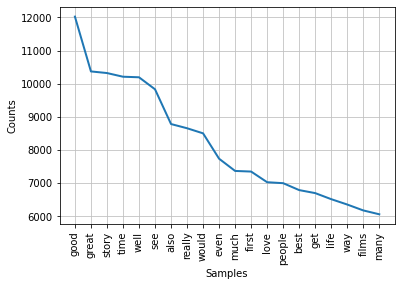

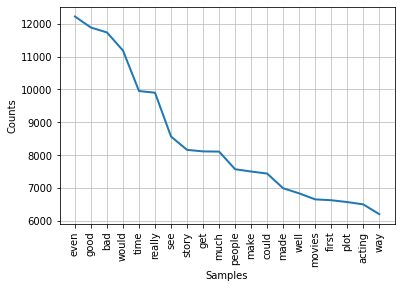

In [55]:
# removendo stop words
from nltk.corpus import stopwords
stop=stopwords.words('english')

# Separando em dataframes positivos e negativos para analise
positivedata = data[ data['label'] == 1]
positivedata =positivedata['text']
negativedata = data[data['label'] == 0]
negativedata= negativedata['text']

# analisando frequencia de palavras para casos negativos e positivos
# removendo stop words e as palavras movie e film
words_positive=[]
for sentences in positivedata:
    for word in tokenizer(sentences):
        if word not in stop and word not in ['movie', 'film', 'one', 'like']:
            words_positive.append(word)
            
nlp_words=nltk.FreqDist(words_positive)
nlp_words.plot(20);
            
words_negative=[]
for sentences in negativedata:
    for word in tokenizer(sentences):
        if word not in stop and word not in ['movie', 'film', 'one', 'like']:
            words_negative.append(word)
            
nlp_words=nltk.FreqDist(words_negative)
nlp_words.plot(20);

# Observação a palavra GOOD aparece com uma frequencia relativamente grande em ambos!

In [56]:
# Usando um TF-IDF Vertorizer para preparar os dados para treinar o modelo

from sklearn.feature_extraction.text import TfidfVectorizer

tfidf=TfidfVectorizer(strip_accents=None,lowercase=False,preprocessor=None,tokenizer=tokenizer_porter,use_idf=True,norm='l2',smooth_idf=True)
y=data.label.values
x=tfidf.fit_transform(data.text)

In [60]:
# Dividindo base de dados
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(x,y,random_state=1,test_size=0.5,shuffle=False)

In [ ]:
# modelo
from sklearn.linear_model import LogisticRegressionCV
clf=LogisticRegressionCV(cv=6,scoring='accuracy',random_state=0,n_jobs=-1,verbose=3,max_iter=500).fit(X_train,y_train)
y_pred = clf.predict(X_test)
from sklearn import metrics

# Acurácia do modelo
print("Acurácia:",metrics.accuracy_score(y_test, y_pred))